## 1. Import Necessary Libraries

In [1]:
import os
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import random

import ipywidgets as widgets
from six import BytesIO
from IPython.display import display
from PIL import Image
import shutil

import tensorflow as tf
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.builders import model_builder

In [2]:
# CPU Optimizations 
tf.config.experimental.set_virtual_device_configuration(
    tf.config.experimental.list_physical_devices("CPU")[0],
    [tf.config.experimental.VirtualDeviceConfiguration()],
)

# GPU Memory Limit Optimization
tf.config.set_logical_device_configuration(
    tf.config.list_physical_devices("GPU")[0],
    [tf.config.LogicalDeviceConfiguration(memory_limit=10799)],
)

## 2. Data Preprocessing Skip this Process if Already Run It)

In [3]:
# Load Train Dataset
df_train_raw = pd.read_csv('data/nutri_table/train.csv')

# Load necessary columns
df_train_filtered = df_train_raw[['image_id', 'width', 'height', 'table_bbox', 'category_name']]

# load data that only has category_name "['nutrition-table']"
df_train_filtered = df_train_filtered[df_train_filtered['category_name'].apply(lambda x: x == '[\'nutrition-table\']')]
# df_train_filtered = df_train_filtered[df_train_filtered['width'].apply(lambda x: x < 3000)]
# df_train_filtered = df_train_filtered[df_train_filtered['height'].apply(lambda x: x < 3000)]
df_train_filtered = df_train_filtered.drop(columns=['category_name'])
df_train_filtered = df_train_filtered.reset_index(drop=True)
df_train_filtered.info()
df_train_filtered

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 915 entries, 0 to 914
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_id    915 non-null    object
 1   width       915 non-null    int64 
 2   height      915 non-null    int64 
 3   table_bbox  915 non-null    object
dtypes: int64(2), object(2)
memory usage: 28.7+ KB


,image_id,width,height,table_bbox
0,0009800892204_1,2592,1944,"[array([0.05709876, 0.01427469, 0.60350156, 0...."
1,0024842112219_3,306,408,"[array([0.15196079, 0.14705883, 0.5882353 , 0...."
2,3560070581849_11,692,720,"[array([0.00833333, 0.01011561, 0.99444443, 0...."
3,0061954000539_4,3120,4208,"[array([0.17181559, 0.3201923 , 0.625 , 0...."
4,25231656_1,1944,2592,"[array([0.25124797, 0.14320119, 0.46832615, 0...."
...,...,...,...,...
910,26154404_2,2000,1125,"[array([0.03288889, 0.267 , 0.43100584, 0...."
911,0041148813558_3,3120,4208,"[array([0.4983365, 0.2798077, 0.6756179, 0.717..."
912,00500241_4,1501,640,"[array([0.02152778, 0.00148049, 0.890625 , 0...."
913,0030100053149_2,1836,3264,"[array([0.11917892, 0.30501089, 0.5661765 , 0...."


In [4]:
# Load Validation Dataset
df_val_raw = pd.read_csv('data/nutri_table/val.csv')

# Load necessary columns
df_val_filtered = df_val_raw[['image_id', 'width', 'height', 'table_bbox', 'category_name']]

# load data that only has category_name "['nutrition-table']"
df_val_filtered = df_val_filtered[df_val_filtered['category_name'].apply(lambda x: x == '[\'nutrition-table\']')]
# df_val_filtered = df_val_filtered[df_val_filtered['width'].apply(lambda x: x < 3000)]
# df_val_filtered = df_val_filtered[df_val_filtered['height'].apply(lambda x: x < 3000)]
df_val_filtered = df_val_filtered.drop(columns=['category_name'])
df_val_filtered = df_val_filtered.reset_index(drop=True)
df_val_filtered.info()
df_val_filtered

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99 entries, 0 to 98
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_id    99 non-null     object
 1   width       99 non-null     int64 
 2   height      99 non-null     int64 
 3   table_bbox  99 non-null     object
dtypes: int64(2), object(2)
memory usage: 3.2+ KB


,image_id,width,height,table_bbox
0,0041129077641_1,3120,4208,"[array([0.4871673 , 0.27339745, 0.64093405, 0...."
1,0070200581159_1,2448,3264,"[array([0.24662991, 0.26552287, 0.45325696, 0...."
2,0064144043064_2,2000,2666,"[array([0.10315078, 0.04094965, 0.51433176, 0...."
3,0051500700167_1,2448,3264,"[array([0.31433877, 0.16432449, 0.8336485 , 0...."
4,0016447100951_1,2000,2697,"[array([0.36299592, 0.35 , 0.6154987 , 0...."
...,...,...,...,...
94,0071962226104_3,2000,1500,"[array([0.34341377, 0.17637762, 0.8466305 , 0...."
95,0039000081047_4,2448,3264,"[array([0.2526378 , 0.21890113, 0.6482843 , 0...."
96,26209142_6,963,707,"[array([5.2012689e-04, 1.0787505e-02, 1.000000..."
97,20511586_3,1936,2592,"[array([0.00419526, 0.2200406 , 0.9211625 , 0...."


In [5]:
# Create new directories: data/nutri_table_clean/train and data/nutri_table_clean/val
os.makedirs('data/nutri_table_clean/train', exist_ok=True)
os.makedirs('data/nutri_table_clean/val', exist_ok=True)

# Copy train and validation data to the new directory based on the filtered category_name
for idx, name in enumerate(df_train_filtered['image_id']):
    shutil.copy(
        os.path.abspath(f'data/nutri_table/train/{name}.jpg'),
        f'data/nutri_table_clean/train/{idx}.jpg',
    )
    
for idx, name in enumerate(df_val_filtered['image_id']):
    shutil.copy(
        os.path.abspath(f'data/nutri_table/val/{name}.jpg'),
        f'data/nutri_table_clean/val/{idx}.jpg',
    )

In [6]:
# Change image_id to index
df_train_filtered['image_id'] = df_train_filtered.index
df_val_filtered['image_id'] = df_val_filtered.index

In [7]:
# Export new csv to data/nutri_table_clean
df_train_filtered.to_csv('data/nutri_table_clean/train.csv', index=False)
df_val_filtered.to_csv('data/nutri_table_clean/val.csv', index=False)

## 3. Load Clean Dataset

In [3]:
# Load cleaned csv Train Dataset
df_train = pd.read_csv('data/nutri_table_clean/train.csv')
df_train.info()
df_train

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 915 entries, 0 to 914
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_id    915 non-null    int64 
 1   width       915 non-null    int64 
 2   height      915 non-null    int64 
 3   table_bbox  915 non-null    object
dtypes: int64(3), object(1)
memory usage: 28.7+ KB


,image_id,width,height,table_bbox
0,0,2592,1944,"[array([0.05709876, 0.01427469, 0.60350156, 0...."
1,1,306,408,"[array([0.15196079, 0.14705883, 0.5882353 , 0...."
2,2,692,720,"[array([0.00833333, 0.01011561, 0.99444443, 0...."
3,3,3120,4208,"[array([0.17181559, 0.3201923 , 0.625 , 0...."
4,4,1944,2592,"[array([0.25124797, 0.14320119, 0.46832615, 0...."
...,...,...,...,...
910,910,2000,1125,"[array([0.03288889, 0.267 , 0.43100584, 0...."
911,911,3120,4208,"[array([0.4983365, 0.2798077, 0.6756179, 0.717..."
912,912,1501,640,"[array([0.02152778, 0.00148049, 0.890625 , 0...."
913,913,1836,3264,"[array([0.11917892, 0.30501089, 0.5661765 , 0...."


In [4]:
# Load cleaned csv Validation Dataset
df_val = pd.read_csv('data/nutri_table_clean/val.csv')
df_val.info()
df_val

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99 entries, 0 to 98
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_id    99 non-null     int64 
 1   width       99 non-null     int64 
 2   height      99 non-null     int64 
 3   table_bbox  99 non-null     object
dtypes: int64(3), object(1)
memory usage: 3.2+ KB


,image_id,width,height,table_bbox
0,0,3120,4208,"[array([0.4871673 , 0.27339745, 0.64093405, 0...."
1,1,2448,3264,"[array([0.24662991, 0.26552287, 0.45325696, 0...."
2,2,2000,2666,"[array([0.10315078, 0.04094965, 0.51433176, 0...."
3,3,2448,3264,"[array([0.31433877, 0.16432449, 0.8336485 , 0...."
4,4,2000,2697,"[array([0.36299592, 0.35 , 0.6154987 , 0...."
...,...,...,...,...
94,94,2000,1500,"[array([0.34341377, 0.17637762, 0.8466305 , 0...."
95,95,2448,3264,"[array([0.2526378 , 0.21890113, 0.6482843 , 0...."
96,96,963,707,"[array([5.2012689e-04, 1.0787505e-02, 1.000000..."
97,97,1936,2592,"[array([0.00419526, 0.2200406 , 0.9211625 , 0...."


## 4. Convert Bounding Boxes Object (String) into Numpy Array

In [5]:
# Convert String object on table_bbox column to numpy array float32
def bbox_convert_to_numpy(data):
    bbox_str = data.replace('[array([', '').replace(')]', '')
    bbox_str = bbox_str.replace(', dtype=float32', '').replace(',\n       dtype=float32)', '').replace('                                               ]', '')
    bbox_str = bbox_str.replace(']', '')
    return np.array([[float(x) for x in bbox_str.split(', ')]], dtype=np.float32)

In [6]:
# Create bbox_train and bbox_val that store numpy array float32
train_bbox = df_train['table_bbox'].apply(bbox_convert_to_numpy).tolist()
val_bbox = df_val['table_bbox'].apply(bbox_convert_to_numpy).tolist()

# Create Ground Truth Boxes
gt_boxes = train_bbox[:100]

print(f'Used Ground Truth Boxes: {len(gt_boxes)}')
gt_boxes

Used Ground Truth Boxes: 100


[array([[0.05709876, 0.01427469, 0.60350156, 0.99112654]], dtype=float32),
 array([[0.15196079, 0.14705883, 0.5882353 , 0.5163399 ]], dtype=float32),
 array([[0.00833333, 0.01011561, 0.99444443, 0.9783237 ]], dtype=float32),
 array([[0.17181559, 0.3201923 , 0.625     , 0.6278846 ]], dtype=float32),
 array([[0.25124797, 0.14320119, 0.46832615, 0.37657744]], dtype=float32),
 array([[0.00937734, 0.00358531, 0.84208554, 0.98955804]], dtype=float32),
 array([[0.5670886, 0.228    , 0.9004219, 0.605    ]], dtype=float32),
 array([[0.16758579, 0.07114985, 0.7397813 , 0.47778004]], dtype=float32),
 array([[0.25971365, 0.03129306, 0.8641857 , 0.6568233 ]], dtype=float32),
 array([[0.2631111, 0.2      , 0.7724444, 0.69     ]], dtype=float32),
 array([[0.453     , 0.152     , 0.7005    , 0.85333335]], dtype=float32),
 array([[0.18768825, 0.29350737, 0.5971386 , 0.7426372 ]], dtype=float32),
 array([[0.3090572 , 0.14022757, 0.6771461 , 0.50784117]], dtype=float32),
 array([[0.17973268, 0.4854679 , 

## 5. Display the Examples of The Train Data Based on Images Path

In [7]:
# Load image into numpy array
def load_image_into_numpy_array(path):
    img_data = tf.io.gfile.GFile(path, 'rb').read()
    image = Image.open(BytesIO(img_data))
    if image.mode != 'RGB':
        image = image.convert('RGB')
    (im_width, im_height) = image.size
    return np.array(image).reshape((im_height, im_width, 3)).astype(np.uint8)

In [8]:
# Load image data directory
BASE_DIR = 'data/nutri_table_clean/'
train_image_dir = os.path.join(BASE_DIR, 'train')
val_image_dir = os.path.join(BASE_DIR, 'val')

In [9]:
# Load images and convert to numpy array
train_images_np = []

for i in range(100):
  image_path = os.path.join(train_image_dir, str(i) + '.jpg')
  train_images_np.append(load_image_into_numpy_array(image_path))
  
# Show number of images in train directory
print(f'Train Images: {len(os.listdir(train_image_dir))}')
print(f'Used Train Images: {len(train_images_np)}')

Train Images: 915
Used Train Images: 100


In [10]:
# Load Test images and convert to numpy array
val_images_np = []

for i in range(len(os.listdir(val_image_dir))):
  image_path_val = os.path.join(val_image_dir, str(i) + '.jpg')
  val_images_np.append(load_image_into_numpy_array(image_path_val))

# Show number of images in validation directory
print(f'Validation Images: {len(os.listdir(val_image_dir))}')

Validation Images: 99


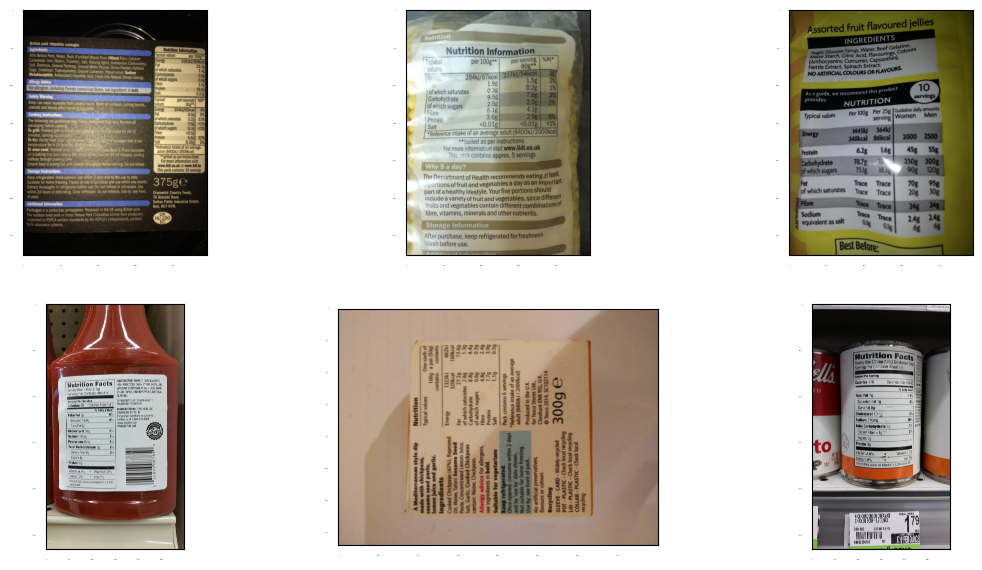

In [ ]:
%matplotlib inline

plt.rcParams['axes.grid'] = False
plt.rcParams['xtick.labelsize'] = False
plt.rcParams['ytick.labelsize'] = False
plt.rcParams['xtick.top'] = False
plt.rcParams['xtick.bottom'] = False
plt.rcParams['ytick.left'] = False
plt.rcParams['ytick.right'] = False
plt.rcParams['figure.figsize'] = [14, 7]

random_indices = random.sample(range(len(train_images_np)), 6)

# Show 6 random images from Used Train Images data
for idx, random_idx in enumerate(random_indices):
  plt.subplot(2, 3, idx+1)
  plt.imshow(train_images_np[random_idx])
plt.show()

## 6. Create Tensor Data from Images and Ground Truth Boxes

In [11]:
tf.keras.backend.clear_session()

table_class_id = 1
category_index = {table_class_id: {'id': table_class_id, 'name': 'Nutrition Table'}}
num_classes = 1
label_id_offset = 1

train_image_tensors = []
gt_classes_one_hot_tensors = []
gt_box_tensors = []

for (train_image_np, gt_box_np) in zip(
    train_images_np, gt_boxes):
  train_image_tensors.append(tf.expand_dims(tf.convert_to_tensor(
      train_image_np, dtype=tf.float32), axis=0))
  gt_box_tensors.append(tf.convert_to_tensor(gt_box_np, dtype=tf.float32))
  zero_indexed_groundtruth_classes = tf.convert_to_tensor(
      np.ones(shape=[gt_box_np.shape[0]], dtype=np.int32) - label_id_offset)
  gt_classes_one_hot_tensors.append(tf.one_hot(
      zero_indexed_groundtruth_classes, num_classes))
  
print(f'Done preparing {len(train_image_tensors)} data')


Done preparing 100 data


## 7. Display The Images with Their Ground Truth Boxes

In [12]:
def plot_detections(image_np, boxes, classes, scores, category_index, figsize=(12, 16), image_name=None):
    # Find the index of the highest score
    max_score_idx = np.argmax(scores)
    
    # Get the box, class, and score with the highest score
    max_box = boxes[max_score_idx]
    max_class = classes[max_score_idx]
    max_score = scores[max_score_idx]
    
    image_np_with_annotations = image_np.copy()
    viz_utils.visualize_boxes_and_labels_on_image_array(
        image_np_with_annotations,
        np.array([max_box]),  
        np.array([max_class]),  
        np.array([max_score]),
        category_index,
        use_normalized_coordinates=True,
        min_score_thresh=0.1, # Lower the treshhold to show all predicted boxes 
    )
    
    if image_name:
        plt.imsave(image_name, image_np_with_annotations)
    else:
        plt.imshow(image_np_with_annotations)

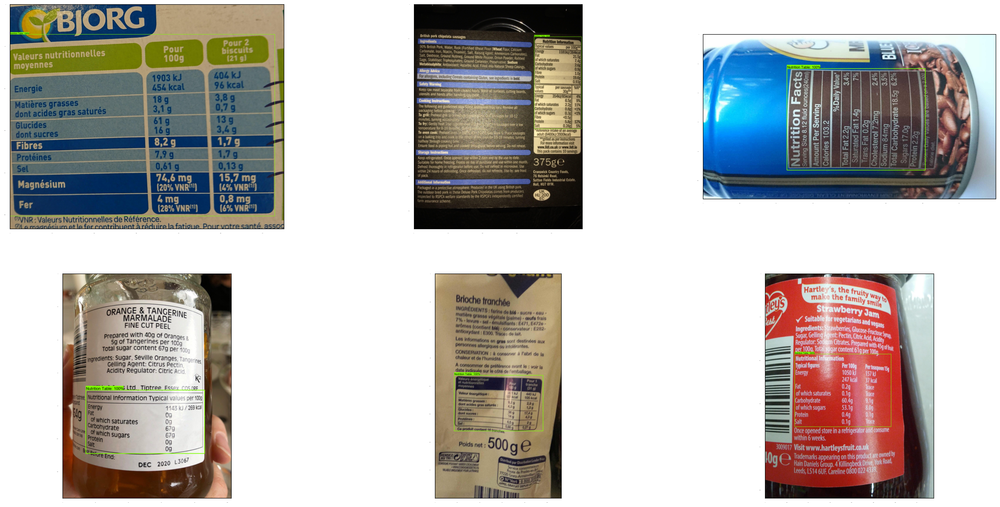

In [ ]:
dummy_scores = np.array([1.0], dtype=np.float32)  # give boxes a score of 100%

# Show 6 random images from Used Train Images data with Ground Truth Boxes
random_indices = random.sample(range(len(train_images_np)), 6)
plt.figure(figsize=(30, 15))
for idx, random_idx in enumerate(random_indices):
    plt.subplot(2, 3, idx+1)
    gt_boxes_np = np.array(gt_boxes[random_idx])
    plot_detections(
            train_images_np[random_idx],
            gt_boxes_np,
            np.ones(shape=[gt_boxes_np.shape[0]], dtype=np.int32),
            dummy_scores, category_index)
plt.show()

## 8. Build a Pretrained SSD Resnet50 FPN Model and Fine Tune it with Used Train Images Data

In [ ]:
# Download the pre-trained model SSD ResNet50 V1 FPN 640x640 from TensorFlow Model Zoo
# Run this only once if there is no pre-trained model in the directory
!curl -OL http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed

  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0  233M    0  172k    0     0  98917      0  0:41:14  0:00:01  0:41:13 99122
  0  233M    0  374k    0     0   134k      0  0:29:36  0:00:02  0:29:34  134k
  0  233M    0  540k    0     0   142k      0  0:27:54  0:00:03  0:27:51  142k
  0  233M    0  664k    0     0   138k      0  0:28:50  0:00:04  0:28:46  138k
  0  233M    0  760k    0     0   131k      0  0:30:19  0:00:05  0:30:14  152k
  0  233M    0  834k    0     0   122k      0  0:32:35  0:00:06  0:32:29  131k
  0  233M    0 1036k    0     0   132k      0  0:29:58  0:00:07  0:29:51  131k
  0  233M    0 1141k    0     0   129k      0  0:30:50  0:00:08  0:30:42  119k
  0  233M    0 1225k    0     0   125k      0  0:31

In [13]:
# Extract the tar.gz file
!tar -xf ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.tar.gz

# Define source of model checkpoint and destination path
source_path = 'ssd_resnet50_v1_fpn_640x640_coco17_tpu-8/checkpoint'
destination_path = 'models/research/object_detection/test_data/checkpoint'

# Copy the files, overwriting if they already exist
if os.path.exists(destination_path):
    shutil.rmtree(destination_path)
shutil.copytree(source_path, destination_path)

'models/research/object_detection/test_data/checkpoint'

In [14]:
tf.keras.backend.clear_session()

print('Building model and restoring weights for fine-tuning...', flush=True)

# Load pipeline config and checkpoint to build detection model
pipeline_config = 'models/research/object_detection/configs/tf2/ssd_resnet50_v1_fpn_640x640_coco17_tpu-8.config'
checkpoint_path = 'models/research/object_detection/test_data/checkpoint/ckpt-0'
configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']
model_config.ssd.num_classes = num_classes # number of classes is 1
model_config.ssd.freeze_batchnorm = True
detection_model = model_builder.build(model_config=model_config, is_training=True) 

# Restore checkpoint
fake_box_predictor = tf.compat.v2.train.Checkpoint(
    _base_tower_layers_for_heads=detection_model._box_predictor._base_tower_layers_for_heads,
    _box_prediction_head=detection_model._box_predictor._box_prediction_head)

fake_model = tf.compat.v2.train.Checkpoint(
          _feature_extractor=detection_model._feature_extractor,
          _box_predictor=fake_box_predictor)

ckpt = tf.compat.v2.train.Checkpoint(model=fake_model)
ckpt.restore(checkpoint_path).expect_partial()

# Run model through a dummy image so that variables are Restored
image, shapes = detection_model.preprocess(tf.zeros([1, 640, 640, 3]))
prediction_dict = detection_model.predict(image, shapes)
_ = detection_model.postprocess(prediction_dict, shapes)

print('Weights restored!')

Building model and restoring weights for fine-tuning...


Weights restored!


In [15]:
tf.keras.backend.set_learning_phase(True)

batch_size = 16
learning_rate = 0.01
num_epoch = 100

# Select variables in top layers to fine-tune.
trainable_variables = detection_model.trainable_variables
to_fine_tune = []
prefixes_to_train = [
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalBoxHead',
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalClassHead']
for var in trainable_variables:
  if any([var.name.startswith(prefix) for prefix in prefixes_to_train]):
    to_fine_tune.append(var)

# Set up forward + backward pass for a single train step
def get_model_train_step_function(model, optimizer, vars_to_fine_tune):

  # Use tf.function for a bit of speed
  @tf.function
  def train_step_fn(image_tensors,
                    groundtruth_boxes_list,
                    groundtruth_classes_list):

    shapes = tf.constant(batch_size * [[640, 640, 3]], dtype=tf.int32)
    model.provide_groundtruth(
        groundtruth_boxes_list=groundtruth_boxes_list,
        groundtruth_classes_list=groundtruth_classes_list)
    with tf.GradientTape() as tape:
      preprocessed_images = tf.concat(
          [detection_model.preprocess(image_tensor)[0]
           for image_tensor in image_tensors], axis=0)
      prediction_dict = model.predict(preprocessed_images, shapes)
      losses_dict = model.loss(prediction_dict, shapes)
      total_loss = losses_dict['Loss/localization_loss'] + losses_dict['Loss/classification_loss']
      gradients = tape.gradient(total_loss, vars_to_fine_tune)
      optimizer.apply_gradients(zip(gradients, vars_to_fine_tune))
    return total_loss

  return train_step_fn

optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate, momentum=0.9)
train_step_fn = get_model_train_step_function(detection_model, optimizer, to_fine_tune)

print('Start fine-tuning!', flush=True)

for idx in range(num_epoch):
  # Grab keys for a random subset of examples
  all_keys = list(range(len(train_images_np)))
  random.shuffle(all_keys)
  example_keys = all_keys[:batch_size]

  # Get the ground truth
  gt_boxes_list = [gt_box_tensors[key] for key in example_keys]
  gt_classes_list = [gt_classes_one_hot_tensors[key] for key in example_keys]
  image_tensors = [train_image_tensors[key] for key in example_keys]

  # Training step (forward pass + backwards pass)
  total_loss = train_step_fn(image_tensors, gt_boxes_list, gt_classes_list)

  print('Epoch ' + str(idx+1) + '/' + str(num_epoch) + '  loss=' +  str(total_loss.numpy()), flush=True)

print('Done fine-tuning!')

Start fine-tuning!


c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\keras\backend.py:451: UserWarning: `tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.
  warnings.warn(


Epoch 1/100  loss=1.6181394
Epoch 2/100  loss=1.5227592
Epoch 3/100  loss=1.1410726
Epoch 4/100  loss=1.2245313


Epoch 5/100  loss=1.0298284


Epoch 6/100  loss=1.0064993
Epoch 7/100  loss=1.000143
Epoch 8/100  loss=1.3026116
Epoch 9/100  loss=0.89412695
Epoch 10/100  loss=1.042858
Epoch 11/100  loss=0.9108862
Epoch 12/100  loss=1.1405934
Epoch 13/100  loss=0.9574075
Epoch 14/100  loss=1.2833061
Epoch 15/100  loss=1.164178
Epoch 16/100  loss=1.0923135
Epoch 17/100  loss=0.9036684
Epoch 18/100  loss=1.1080056
Epoch 19/100  loss=0.93511593
Epoch 20/100  loss=0.7979427
Epoch 21/100  loss=0.97600394
Epoch 22/100  loss=0.8879016
Epoch 23/100  loss=0.9371221
Epoch 24/100  loss=0.9021256
Epoch 25/100  loss=0.8051603
Epoch 26/100  loss=0.8131105
Epoch 27/100  loss=0.77808523
Epoch 28/100  loss=0.8062676
Epoch 29/100  loss=0.7650676
Epoch 30/100  loss=0.7733264
Epoch 31/100  loss=0.744053
Epoch 32/100  loss=0.81161803
Epoch 33/100  loss=0.8579563
Epoch 34/100  loss=0.6574013
Epoch 35/100  loss=0.6067339
Epoch 36/100  loss=0.6559658
Epoch 37/100  loss=0.6716615
Epoch 38/100  loss=0.59840906
Epoch 39/100  loss=0.6243928
Epoch 40/100  lo

ResourceExhaustedError: Graph execution error:

Detected at node 'ResNet50V1_FPN/model/conv2_block1_3_bn/FusedBatchNormV3' defined at (most recent call last):
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\runpy.py", line 196, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\runpy.py", line 86, in _run_code
      exec(code, run_globals)
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\ipykernel_launcher.py", line 18, in <module>
      app.launch_new_instance()
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\traitlets\config\application.py", line 1075, in launch_instance
      app.start()
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\ipykernel\kernelapp.py", line 739, in start
      self.io_loop.start()
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\tornado\platform\asyncio.py", line 205, in start
      self.asyncio_loop.run_forever()
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\asyncio\base_events.py", line 603, in run_forever
      self._run_once()
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\asyncio\base_events.py", line 1909, in _run_once
      handle._run()
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\asyncio\events.py", line 80, in _run
      self._context.run(self._callback, *self._args)
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\ipykernel\kernelbase.py", line 545, in dispatch_queue
      await self.process_one()
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\ipykernel\kernelbase.py", line 534, in process_one
      await dispatch(*args)
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\ipykernel\kernelbase.py", line 437, in dispatch_shell
      await result
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\ipykernel\ipkernel.py", line 362, in execute_request
      await super().execute_request(stream, ident, parent)
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\ipykernel\kernelbase.py", line 778, in execute_request
      reply_content = await reply_content
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\ipykernel\ipkernel.py", line 449, in do_execute
      res = shell.run_cell(
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\ipykernel\zmqshell.py", line 549, in run_cell
      return super().run_cell(*args, **kwargs)
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\IPython\core\interactiveshell.py", line 3075, in run_cell
      result = self._run_cell(
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\IPython\core\interactiveshell.py", line 3130, in _run_cell
      result = runner(coro)
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\IPython\core\async_helpers.py", line 128, in _pseudo_sync_runner
      coro.send(None)
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\IPython\core\interactiveshell.py", line 3334, in run_cell_async
      has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\IPython\core\interactiveshell.py", line 3517, in run_ast_nodes
      if await self.run_code(code, result, async_=asy):
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\IPython\core\interactiveshell.py", line 3577, in run_code
      exec(code_obj, self.user_global_ns, self.user_ns)
    File "C:\Users\Azhar\AppData\Local\Temp\ipykernel_23352\2037615239.py", line 61, in <module>
      total_loss = train_step_fn(image_tensors, gt_boxes_list, gt_classes_list)
    File "C:\Users\Azhar\AppData\Local\Temp\ipykernel_23352\2037615239.py", line 34, in train_step_fn
      prediction_dict = model.predict(preprocessed_images, shapes)
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\object_detection\meta_architectures\ssd_meta_arch.py", line 570, in predict
      if self._feature_extractor.is_keras_model:
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\object_detection\meta_architectures\ssd_meta_arch.py", line 571, in predict
      feature_maps = self._feature_extractor(preprocessed_inputs)
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\keras\utils\traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\keras\engine\training.py", line 557, in __call__
      return super().__call__(*args, **kwargs)
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\keras\utils\traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\keras\engine\base_layer.py", line 1097, in __call__
      outputs = call_fn(inputs, *args, **kwargs)
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\keras\utils\traceback_utils.py", line 96, in error_handler
      return fn(*args, **kwargs)
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\object_detection\meta_architectures\ssd_meta_arch.py", line 252, in call
      return self._extract_features(inputs)
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\object_detection\models\ssd_resnet_v1_fpn_keras_feature_extractor.py", line 223, in _extract_features
      image_features = self.classification_backbone(
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\keras\utils\traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\keras\engine\training.py", line 557, in __call__
      return super().__call__(*args, **kwargs)
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\keras\utils\traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\keras\engine\base_layer.py", line 1097, in __call__
      outputs = call_fn(inputs, *args, **kwargs)
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\keras\utils\traceback_utils.py", line 96, in error_handler
      return fn(*args, **kwargs)
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\keras\engine\functional.py", line 510, in call
      return self._run_internal_graph(inputs, training=training, mask=mask)
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\keras\engine\functional.py", line 667, in _run_internal_graph
      outputs = node.layer(*args, **kwargs)
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\keras\utils\traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\keras\engine\base_layer.py", line 1097, in __call__
      outputs = call_fn(inputs, *args, **kwargs)
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\keras\utils\traceback_utils.py", line 96, in error_handler
      return fn(*args, **kwargs)
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\object_detection\core\freezable_batch_norm.py", line 68, in call
      return super(FreezableBatchNorm, self).call(inputs, training=training)
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\keras\layers\normalization\batch_normalization.py", line 850, in call
      outputs = self._fused_batch_norm(inputs, training=training)
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\keras\layers\normalization\batch_normalization.py", line 660, in _fused_batch_norm
      output, mean, variance = control_flow_util.smart_cond(
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\keras\utils\control_flow_util.py", line 108, in smart_cond
      return tf.__internal__.smart_cond.smart_cond(
    File "c:\Users\Azhar\anaconda3\envs\tf_gpu_win\lib\site-packages\keras\layers\normalization\batch_normalization.py", line 649, in _fused_batch_norm_inference
      return tf.compat.v1.nn.fused_batch_norm(
Node: 'ResNet50V1_FPN/model/conv2_block1_3_bn/FusedBatchNormV3'
OOM when allocating tensor with shape[16,160,160,256] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[{{node ResNet50V1_FPN/model/conv2_block1_3_bn/FusedBatchNormV3}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info. This isn't available when running in Eager mode.
 [Op:__inference_train_step_fn_938548]

## 9. Display a Prediction on Used Train Images

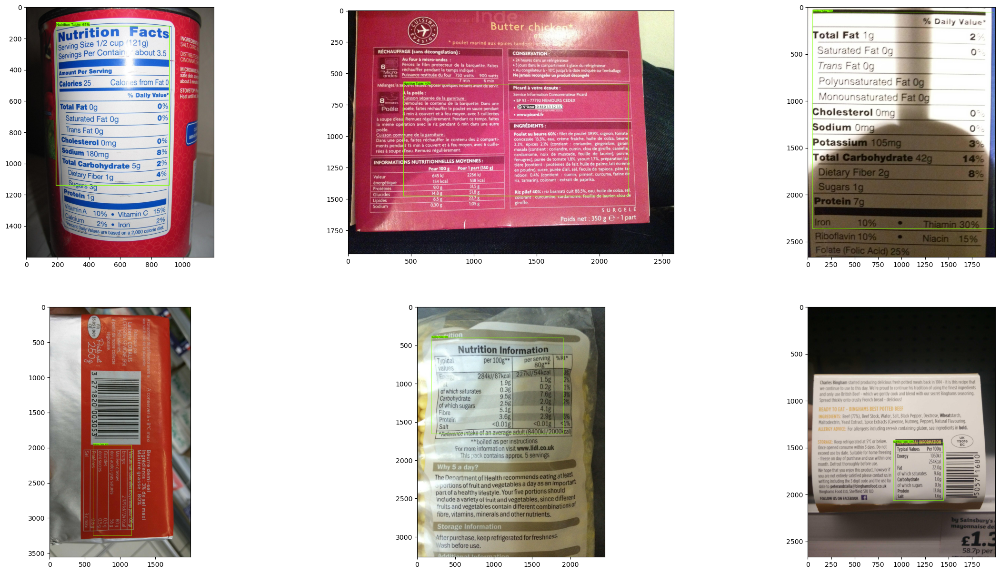

In [20]:
# Display 6 random used train images with their prediction boxes
%matplotlib inline
plt.figure(figsize=(30, 15))
random_indices = random.sample(range(len(train_images_np)), 6)
for idx, random_idx in enumerate(random_indices):
  plt.subplot(2, 3, idx + 1)
  image_np = train_images_np[random_idx]
  input_tensor = tf.convert_to_tensor(image_np[tf.newaxis, ...], dtype=tf.float32)
  detections = detection_model(input_tensor)
  plot_detections(
    image_np,
    detections['detection_boxes'][0].numpy(),
    detections['detection_classes'][0].numpy().astype(np.uint32) + label_id_offset,
    detections['detection_scores'][0].numpy(),
    category_index
  )
plt.show()

## 10. Display a Prediction on Validation/Unseen Images

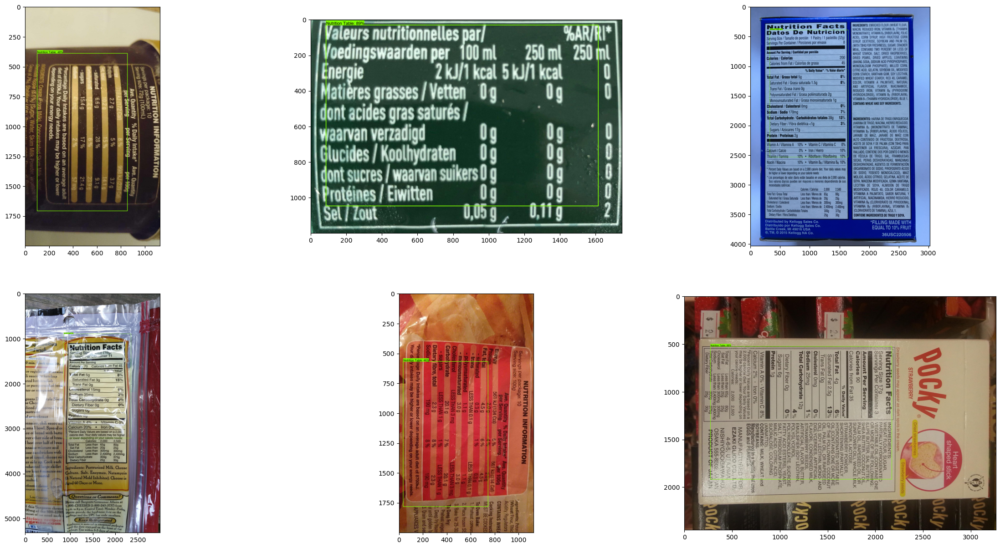

In [23]:
# Display 6 random validation/unseen images with their prediction boxes
plt.figure(figsize=(30, 15))
random_indices = random.sample(range(len(val_images_np)), 6)
for idx, random_idx in enumerate(random_indices):
  plt.subplot(2, 3, idx + 1)
  image_np = val_images_np[random_idx]
  input_tensor = tf.convert_to_tensor(image_np[tf.newaxis, ...], dtype=tf.float32)
  detections = detection_model(input_tensor)
  plot_detections(
    image_np,
    detections['detection_boxes'][0].numpy(),
    detections['detection_classes'][0].numpy().astype(np.uint32) + label_id_offset,
    detections['detection_scores'][0].numpy(),
    category_index
  )
plt.show()

## 11. Display a Prediction on Other Unseen Images

FileUpload(value=(), accept='image/*', description='Upload')

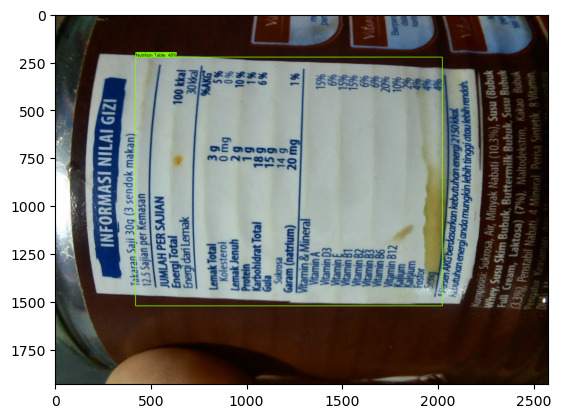

In [25]:
def process_image(change):
    uploaded_file = change["new"]
    if uploaded_file:
        file_content = uploaded_file[0]["content"]
        image = Image.open(BytesIO(file_content)).convert("RGB")
        image_array = np.array(image)

        image_resized = tf.image.resize(image_array, (640, 640))
        input_tensor = tf.convert_to_tensor(image_resized[tf.newaxis, ...], dtype=tf.float32)
        detections = detection_model(input_tensor)

        plot_detections(
            image_np=image_array,
            boxes=detections['detection_boxes'][0].numpy(),
            classes=detections['detection_classes'][0].numpy().astype(np.uint32) + label_id_offset,
            scores=detections['detection_scores'][0].numpy(),
            category_index=category_index
        )
        plt.show() 

# Upload 1 image
upload_widget = widgets.FileUpload(
    accept="image/*",
    multiple=False
)

# Bounding box prediction for the uploaded image and display the result
upload_widget.observe(process_image, names="value")

display(upload_widget)

## 12. Save the Model

In [19]:
# Create a wrapper class to wrap the detection model
class DetectionModelWrapper(tf.keras.Model):
    def __init__(self, detection_model):
        super().__init__()
        self.detection_model = detection_model

    def call(self, inputs):
        # Forward pass model
        preprocessed_inputs, shapes = self.detection_model.preprocess(inputs)
        prediction_dict = self.detection_model.predict(preprocessed_inputs, shapes)
        return self.detection_model.postprocess(prediction_dict, shapes)

keras_model = DetectionModelWrapper(detection_model)

# Set up the model for export
dummy_input = tf.zeros([1, 640, 640, 3], dtype=tf.float32)
_ = keras_model(dummy_input)

# Save the model
output_path = '../model/table-detection-model'
keras_model.save(output_path)

print(f'Model successfully saved at {output_path}')

Instructions for updating:
Use fn_output_signature instead


Instructions for updating:
Use fn_output_signature instead


INFO:tensorflow:Assets written to: ../model/table-detection-model\assets


INFO:tensorflow:Assets written to: ../model/table-detection-model\assets


Model successfully saved at ../model/table-detection-model


## 13. Test to Import Saved Model and Predict (Opsional)

In [ ]:
# Import Saved Model
saved_model_path = '../model/table-detection-model'
detection_model = tf.saved_model.load(saved_model_path)

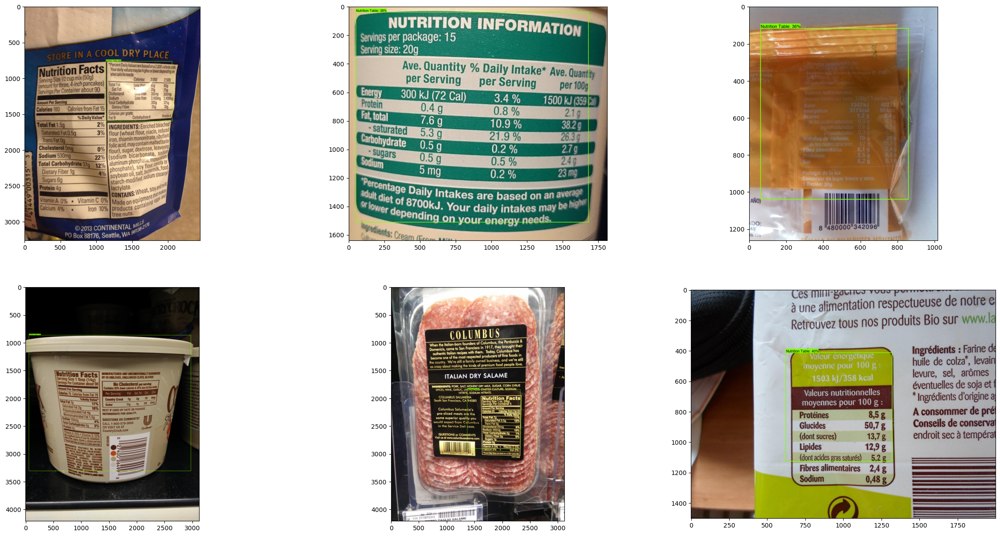

In [27]:
# Predict 6 random images from validation/unseen data with the Imported Model
%matplotlib inline
def predict(image_path):
    image_np = load_image_into_numpy_array(image_path)
    image_resized = tf.image.resize(image_np, (640, 640))
    input_tensor = tf.convert_to_tensor(image_resized[tf.newaxis, ...], dtype=tf.float32)
    detections = detection_model(input_tensor)
    plot_detections(
        image_np,
        detections['detection_boxes'][0].numpy(),
        detections['detection_classes'][0].numpy().astype(np.uint32) + label_id_offset,
        detections['detection_scores'][0].numpy(),
        category_index
    )
    
random_indices = random.sample(range(len(val_images_np)), 6)

plt.figure(figsize=(30, 15))
for idx, random_idx in enumerate(random_indices):
    plt.subplot(2, 3, idx+1)
    predict(os.path.join(val_image_dir, str(random_idx) + '.jpg'))
plt.show()

FileUpload(value=(), accept='image/*', description='Upload')

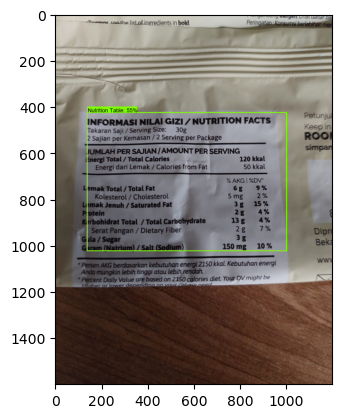

In [29]:
# Predict 6 random images from other unseen data with the Imported Model
def process_image(change):
    uploaded_file = change["new"]
    if uploaded_file:
        file_content = uploaded_file[0]["content"]
        image = Image.open(BytesIO(file_content)).convert("RGB")
        image_array = np.array(image)

        image_resized = tf.image.resize(image_array, (640, 640))
        input_tensor = tf.convert_to_tensor(image_resized[tf.newaxis, ...], dtype=tf.float32)
        detections = detection_model(input_tensor)

        plot_detections(
            image_np=image_array,
            boxes=detections['detection_boxes'][0].numpy(),
            classes=detections['detection_classes'][0].numpy().astype(np.uint32) + label_id_offset,
            scores=detections['detection_scores'][0].numpy(),
            category_index=category_index
        )
        plt.show() 

# Upload 1 image
upload_widget = widgets.FileUpload(
    accept="image/*",  
    multiple=False
)

# Bounding box prediction for the uploaded image and display the result
upload_widget.observe(process_image, names="value")

display(upload_widget)


## 14. Crop Predicted Table

FileUpload(value=(), accept='image/*', description='Upload')

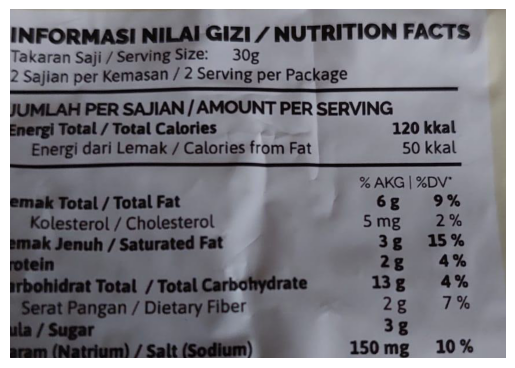

In [41]:
# Crop the detected table from the image
def crop_table(image_path, output_path):
    image_np = load_image_into_numpy_array(image_path)
    image_resized = tf.image.resize(image_np, (640, 640))
    input_tensor = tf.convert_to_tensor(image_resized[tf.newaxis, ...], dtype=tf.float32)
    detections = detection_model(input_tensor)
    
    # Find the index of the highest score
    max_score_idx = np.argmax(detections['detection_scores'][0].numpy())
    
    # Get the box with the highest score
    max_box = detections['detection_boxes'][0].numpy()[max_score_idx]
    
    # Get the coordinates of the box
    ymin, xmin, ymax, xmax = max_box
    
    # Get the height and width of the image
    height, width, _ = image_np.shape
    
    # Get the coordinates of the box in the original image
    ymin = int(ymin * height)
    xmin = int(xmin * width)
    ymax = int(ymax * height)
    xmax = int(xmax * width)
    
    # Crop the table from the image
    table = image_np[ymin:ymax, xmin:xmax]
    
    # Save the cropped table
    table_image = Image.fromarray(table)
    table_image.save(output_path)
    
    # Display the cropped table
    plt.imshow(table_image)
    plt.axis('off')
    plt.show()
    
# Crop the detected table from the uploaded image
def process_image(change):
    uploaded_file = change["new"]
    if uploaded_file:
        file_content = uploaded_file[0]["content"]
        image = Image.open(BytesIO(file_content)).convert("RGB")
        image_array = np.array(image)
        
        # Save the uploaded image
        image.save('input_example/input2.jpg')
        
        # Crop the detected table from the uploaded image
        crop_table('input_example/input2.jpg', 'output_example/output2.jpg')
        
# Upload 1 image
upload_widget = widgets.FileUpload(
    accept="image/*",  
    multiple=False
)

# Crop the detected table from the uploaded image
upload_widget.observe(process_image, names="value")

display(upload_widget)